# Correlación entre las variables
Ya la data está pre-procesada, vamos a ver si las variables están relacionadas

In [1]:
# Importamos las librerias a utilizar
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Importamos los datos
datos = ['../data/RD_GBC_0', '../data/RD_GBC_1', '../data/RD_GBC_2', '../data/RD_GBC_3', '../data/RD_GBC_4',
        '../data/RD_GBC_5', '../data/RD_GBC_6', '../data/RD_GBC_7', '../data/RD_GBC_8', '../data/RD_GBC_9']
df = pd.DataFrame()

for path in datos:
    df_i = pd.read_csv(path)
    df = pd.concat([df, df_i])
    
df.shape

(512000, 18)

Agreguemos unas variables que no están incluidas en el pre-procesamiento: $\Delta\eta$ y $\Delta\phi$

In [3]:
# Definimos una función para calcular delta phi
# From: https://github.com/FFFreitas/Deep-Ensemble-Anomaly-Detection/blob/master/notebooks/Create%20tabular%20data-V2.ipynb

def comp_delta_phi(phi1,phi2):
    delta_phi = np.abs(phi1 - phi2)
    if delta_phi > np.pi:
            delta_phi = 2. * np.pi - delta_phi
    return delta_phi

In [4]:
# Agregamos las variables
df['delta_phi'] = df.apply(lambda row : comp_delta_phi(row['phi_j1'],row['phi_j2']), axis = 1)
df['delta_eta'] = np.abs(df['eta_j1'] - df['eta_j2'])

In [5]:
# Vemos el resultado
df.head()

,pT_j1,m_j1,eta_j1,phi_j1,E_j1,tau_21_j1,nhadrones_j1,pT_j2,m_j2,eta_j2,phi_j2,E_j2,tau_21_j2,nhadrones_j2,m_jj,deltaR_j12,n_hadrones,label,delta_phi,delta_eta
0,1286.727685,106.912129,0.185508,-2.763676,1313.290435,0.624659,36,1283.220733,63.164215,0.064989,0.393688,1287.481934,0.713248,33,170.076344,3.159663,109.0,0.0,3.125821,0.120519
1,1354.394070,614.269108,0.826505,1.365524,1943.559886,0.311688,84,1325.613761,439.064150,-0.874319,-1.786248,1916.370744,0.276881,97,1053.333258,3.581406,208.0,0.0,3.131413,1.700824
2,1214.955723,645.865619,-0.196786,2.040545,1396.840654,0.238205,119,1072.462085,113.768840,0.143831,-1.090330,1089.530630,0.726963,59,759.634459,3.149348,196.0,0.0,3.130875,0.340617
3,1285.227873,516.835248,0.328693,2.975321,1450.485926,0.013429,65,1220.251279,174.796077,0.294854,-0.322661,1285.618789,0.706361,89,691.631325,3.298155,183.0,0.0,2.985204,0.033838
4,1210.415787,129.499352,-0.744836,-2.883347,1567.345300,0.423550,54,1091.785816,155.362262,1.060534,0.264977,1772.340209,0.787662,57,284.861613,3.629229,169.0,1.0,3.134862,1.805370


Podemos calcular los coeficientes de correlación

In [6]:
# https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html
# Eliminamos el label
df_nl = df.drop(['label'], axis=1)

# Calculamos las correlaciones
df_nl.corr()

,pT_j1,m_j1,eta_j1,phi_j1,E_j1,tau_21_j1,nhadrones_j1,pT_j2,m_j2,eta_j2,phi_j2,E_j2,tau_21_j2,nhadrones_j2,m_jj,deltaR_j12,n_hadrones,delta_phi,delta_eta
pT_j1,1.000000,0.223771,0.001910,-0.001944,0.367946,-0.129393,0.059087,0.819154,0.231184,-0.002246,-0.000182,0.324375,-0.131023,0.060745,0.326305,-0.120454,0.056977,0.021801,-0.146281
m_j1,0.223771,1.000000,0.001048,-0.001324,0.100662,-0.365213,0.674922,0.198304,-0.029577,-0.000700,0.000939,0.078286,-0.046063,-0.035847,0.715860,-0.043625,0.363850,-0.020367,-0.049288
eta_j1,0.001910,0.001048,1.000000,-0.001162,-0.003453,-0.002382,0.000862,0.001224,-0.001867,-0.157405,0.002633,-0.002927,-0.000096,-0.002579,-0.000532,-0.005962,-0.001104,0.001013,-0.004920
phi_j1,-0.001944,-0.001324,-0.001162,1.000000,-0.002161,-0.001503,-0.001560,-0.001524,-0.000882,-0.000160,-0.496864,-0.000272,0.001723,-0.000341,-0.001591,0.000130,-0.000715,-0.000400,-0.000245
E_j1,0.367946,0.100662,-0.003453,-0.002161,1.000000,-0.076252,-0.013487,0.297325,0.088532,0.000523,0.000146,0.079926,-0.043747,0.039710,0.135984,0.346179,0.006834,0.004495,0.377017
tau_21_j1,-0.129393,-0.365213,-0.002382,-0.001503,-0.076252,1.000000,-0.042738,-0.130076,-0.046163,0.000812,0.001207,-0.046923,0.090904,0.024079,-0.301234,0.013179,0.034745,-0.029561,0.016527
nhadrones_j1,0.059087,0.674922,0.000862,-0.001560,-0.013487,-0.042738,1.000000,0.034868,-0.035694,-0.000665,0.001581,0.027877,0.022739,-0.010004,0.472160,-0.039007,0.588456,-0.063378,-0.042080
pT_j2,0.819154,0.198304,0.001224,-0.001524,0.297325,-0.130076,0.034868,1.000000,0.237999,-0.000853,0.001226,0.411895,-0.145550,0.042661,0.312310,-0.109688,-0.102983,0.269879,-0.148419
m_j2,0.231184,-0.029577,-0.001867,-0.000882,0.088532,-0.046163,-0.035694,0.237999,1.000000,-0.000150,-0.000381,0.118339,-0.382160,0.669127,0.676766,-0.038483,0.349943,0.005987,-0.046048
eta_j2,-0.002246,-0.000700,-0.157405,-0.000160,0.000523,0.000812,-0.000665,-0.000853,-0.000150,1.000000,-0.000222,0.003302,0.000021,-0.001693,-0.000620,0.003985,-0.001239,0.000871,0.004319


Visualmente es más sencillo entenderlo

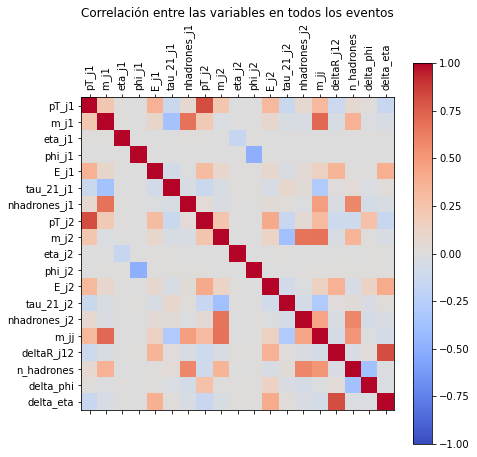

In [7]:
# https://medium.com/@sebastiannorena/finding-correlation-between-many-variables-multidimensional-dataset-with-python-5deb3f39ffb3

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

corr = df_nl.corr()
fig = plt.figure(figsize=[7,7])
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(df_nl.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(df_nl.columns)
ax.set_yticklabels(df_nl.columns)
plt.title('Correlación entre las variables en todos los eventos')
plt.show()

Los cuadros grises indican que no hay correlación. Hacia rojo significa que existe una correlación positiva y hacia azul, una correlación negativa.

Igualmente, podemos graficar el scattering de todas las variables

C:\Users\maria\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


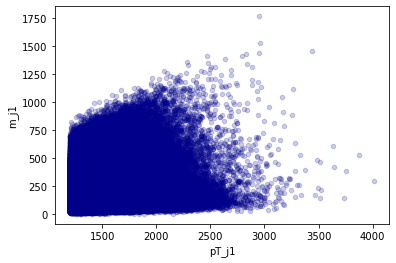

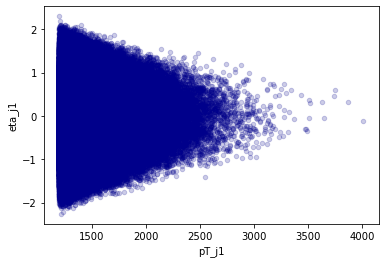

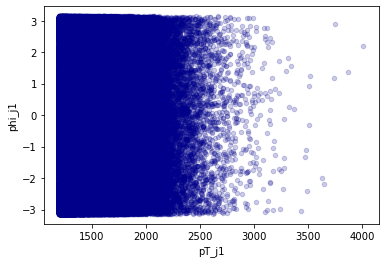

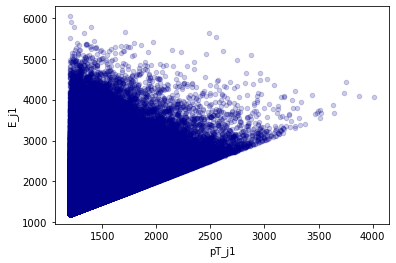

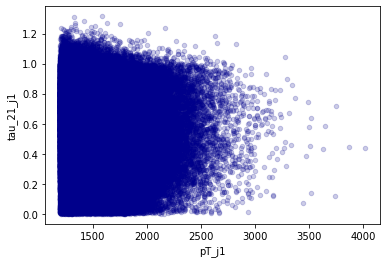

...

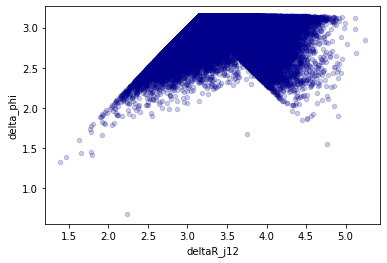

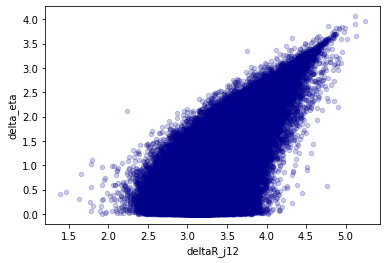

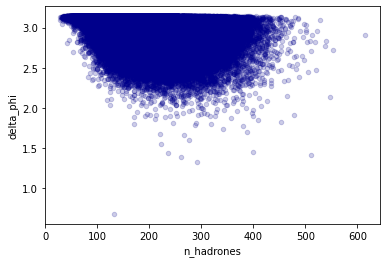

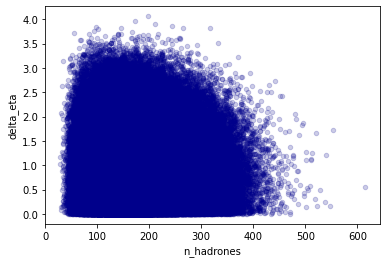

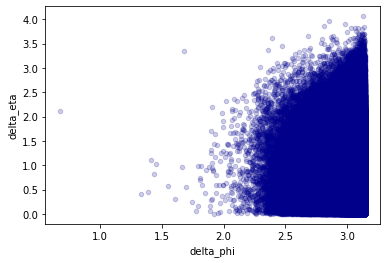

In [8]:
caract = list(df_nl.columns)
caract_new = caract.copy()
for column in caract:
    carac_new = caract_new.remove(column)
    for caract in caract_new:
        df_nl.plot.scatter(column, caract, color='DarkBlue', alpha=0.2)

## Separando señal y fondo
Para poder observar mejor las relaciones, vamos a graficar señal y fondo por separado

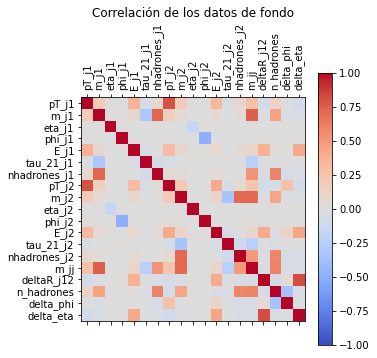

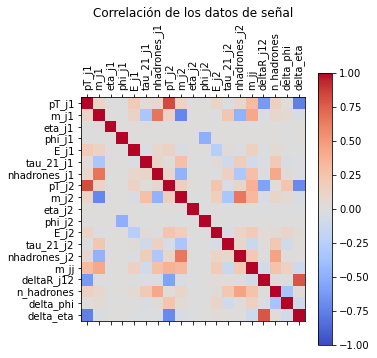

In [9]:
df_bkg = df_nl.loc[df['label']==0] 
df_sig = df_nl.loc[df['label']==1]

corr = df_bkg.corr()
fig = plt.figure(figsize=[5,5])
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(df_bkg.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(df_bkg.columns)
ax.set_yticklabels(df_bkg.columns)
plt.title('Correlación de los datos de fondo')
plt.show()


corr = df_sig.corr()
fig = plt.figure(figsize=[5,5])
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(df_sig.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(df_sig.columns)
ax.set_yticklabels(df_sig.columns)
plt.title('Correlación de los datos de señal')
plt.show()

Notamos que algunas correlaciones solo existen en los datos de señal: la de m_j1 con m_j2, deltaR_j2 con pT_j1, entre otras.

Ahora, graficamos todas las relaciones

In [10]:
# Definimos una función para graficar separando señal y fondo

def plots_scatter(xfondo, yfondo, xsenal, ysenal, xlabel, ylabel):

    fig = plt.figure(figsize=[12, 4])

    # Creamos los subplots
    ax1 = fig.add_subplot(1,2, 1)
    ax2 = fig.add_subplot(1, 2, 2, sharex=ax1, sharey=ax1)

    # señal
    senal= ax2.scatter(xsenal, ysenal, c='r', alpha=0.2)
    ax2.label_outer()

    # fondo
    fondo = ax1.scatter(xfondo, yfondo, c='b', alpha=0.2)
    ax1.set(ylabel=ylabel)

    # Colocamos el título y el eje x
    ax2.legend((senal, fondo), ('Señal', 'Fondo'), loc='upper right', prop={'size': 12})
    fig.suptitle('{} vs. {}'.format(ylabel, xlabel))
    fig.text(0.5, 0.04, xlabel, ha='center', va='center')
    plt.subplots_adjust(wspace=0);
    
    return plt.show()

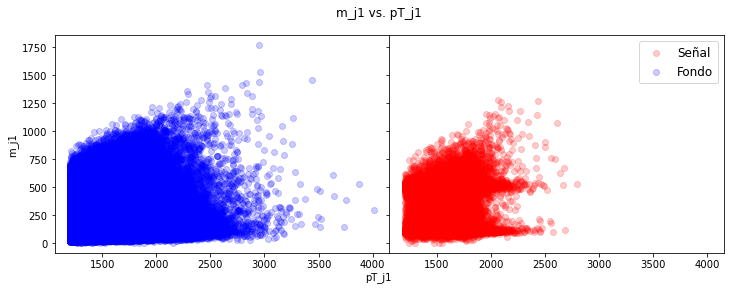

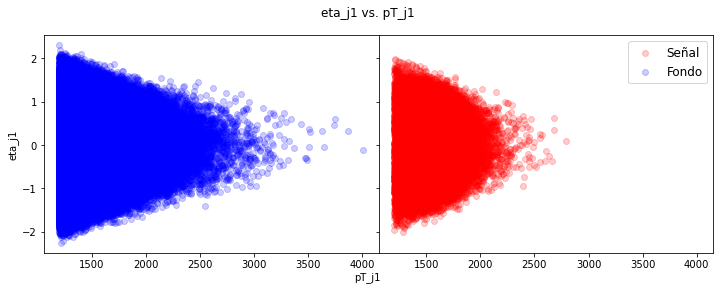

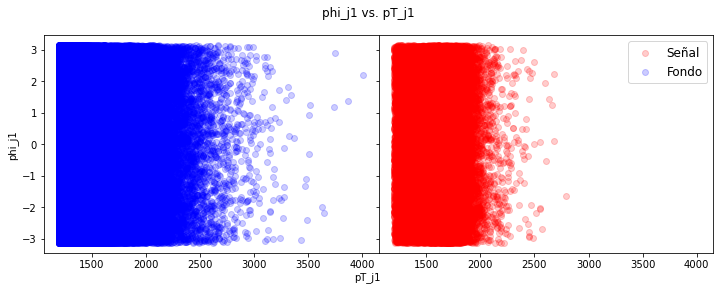

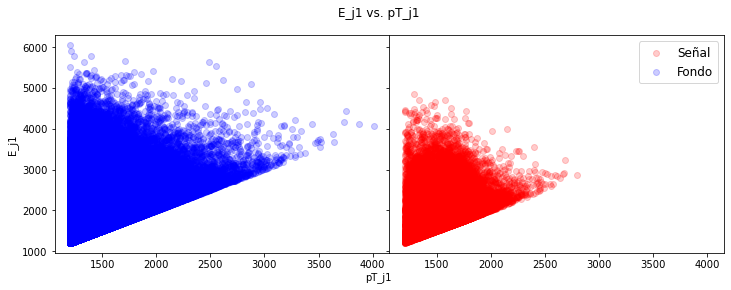

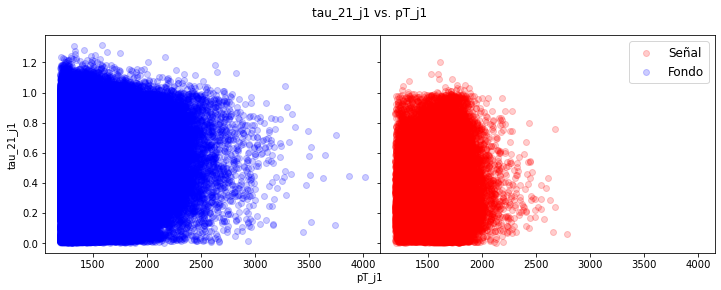

...

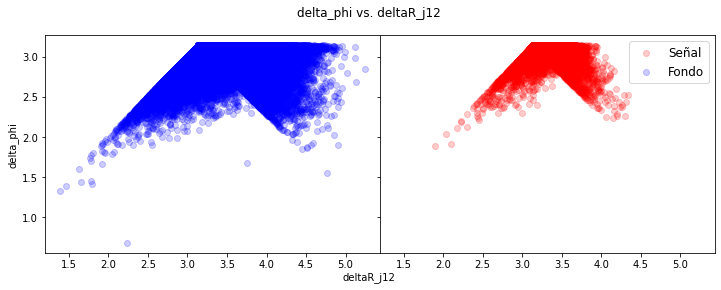

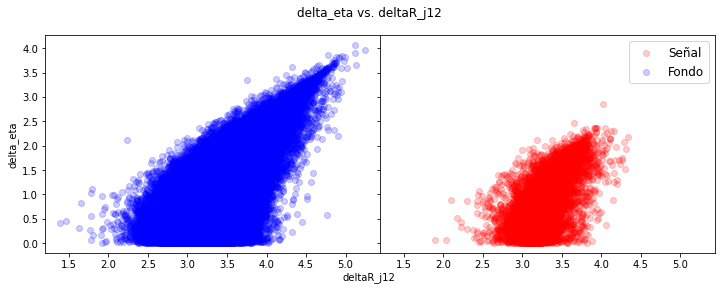

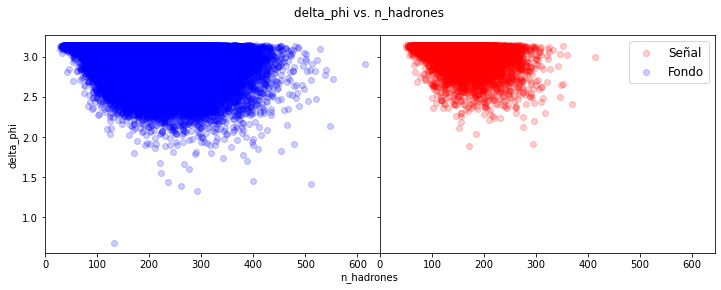

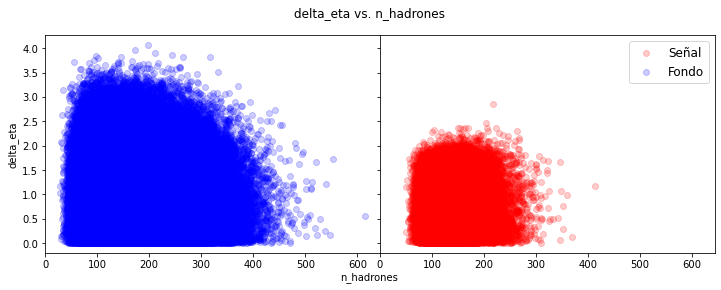

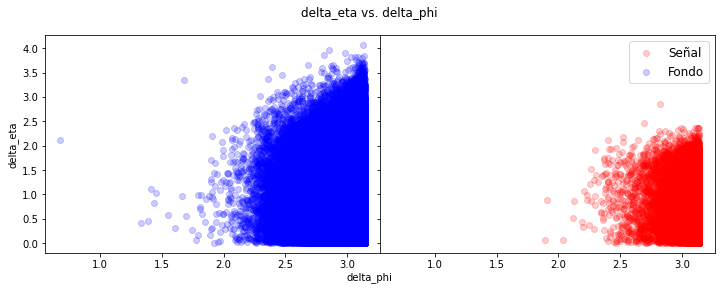

In [12]:
caract = list(df_nl.columns)
caract_new = caract.copy()
df_bkg = df_nl.loc[df['label']==0] 
df_sig = df_nl.loc[df['label']==1]

for column in caract:
    carac_new = caract_new.remove(column)
    for caract in caract_new:
        plots_scatter(df_bkg[column], df_bkg[caract], df_sig[column], df_sig[caract], column, caract)